<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Test---bedroom1.yaml----------start-=--(0,--0.15,-0)" data-toc-modified-id="Test---bedroom1.yaml----------start-=--(0,--0.15,-0)-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Test   bedroom1.yaml          start =  (0, -0.15, 0)</a></span><ul class="toc-item"><li><span><a href="#Localization" data-toc-modified-id="Localization-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Localization</a></span></li><li><span><a href="#Scan-Matching" data-toc-modified-id="Scan-Matching-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Scan Matching</a></span></li><li><span><a href="#Prior" data-toc-modified-id="Prior-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Prior</a></span></li><li><span><a href="#Update" data-toc-modified-id="Update-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Update</a></span></li><li><span><a href="#Innovation" data-toc-modified-id="Innovation-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Innovation</a></span></li></ul></li></ul></div>

# Test   bedroom1.yaml          start =  (0, -0.15, 0)
The following figure shows the comparison between ground truth and localization. Start and the finish points are marked with blue and red circles respectively. Notice the increase in scan matching error when the robot is moving vertically in the middle of the map.

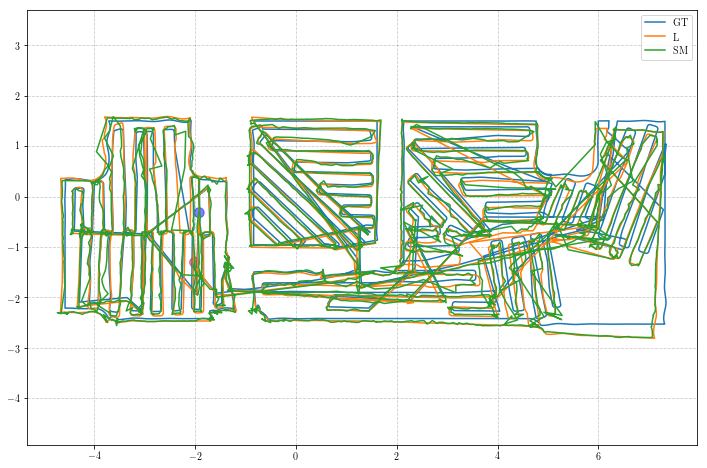

In [1]:
import pandas as pd
import re, csv
from scipy.stats import ttest_ind 
from scipy.stats import ttest_rel
from scipy import stats
import mpld3
from matplotlib import rc



from mpld3 import plugins
from mpld3._server import serve

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt, mpld3
import matplotlib.patches as patches

mpld3.enable_notebook()

def covert_fig_to_html(fig):
    html = mpld3.fig_to_html(fig)
    html = html.replace('"height": 480.0, "width": 640.0','"height": 900.0, "width": 1600.0')
    return html

def eventpatch(ax, x, y, rad=0.1, al=0.5, clr = 'r'):
    patch = patches.Circle((x,y), radius=rad, alpha=al, color=clr)
    ax.add_patch(patch)

def drawEvent(df, loc, color ='r'):
    eventpatch(ax, df.loc[loc, 'x_gt'], df.loc[loc, 'y_gt'], rad=0.01, al=0.8, clr = color)
    eventpatch(ax, df.loc[loc, 'x_gt'], df.loc[loc, 'y_gt'], rad=0.1, al=0.5, clr = color)


fig_collection = []


result_folder = "/home/amirhossein/Desktop/references/compare_with_ground_truth/lm_icp_comparision"
test_folder = "/scnam_match_analysis"
method = "/temp"

file_path = result_folder + test_folder + method + "/error_analysis.csv"

# file_path = "/home/amirhossein/bob_test_results/temp/error_analysis.csv"
df = pd.read_csv(file_path, header=None)
df.columns = ['t','x_gt', 'y_gt', 'th_gt', 'x_l', 'y_l', 'th_l', 'ex_l', 'ey_l', 'eth_l', 'e_pos_l_n',
              'e_ang_l_n', 'ex_l_lb', 'ex_l_ub', 'ey_l_lb', 'ey_l_ub', 'eth_l_lb', 'eth_l_ub', 'x_r',
              'y_r', 'th_r', 'ex_r', 'ey_r', 'eth_r', 'e_pos_r_n', 'e_ang_r_n', 'ex_r_lb', 'ex_r_ub', 
              'ey_r_lb', 'ey_r_ub', 'eth_r_lb', 'eth_r_ub', 'x_u', 'y_u', 'th_u', 'ex_u', 'ey_u', 'eth_u',
              'e_pos_u_n', 'e_ang_u_n', 'ex_u_lb', 'ex_u_ub', 'ey_u_lb', 'ey_u_ub', 'eth_u_lb', 'eth_u_ub','s']

plt.rcParams['figure.figsize'] = [12, 8]
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig = plt.figure();
ax =fig.add_subplot(111)

plt.plot(df['x_gt'], df['y_gt'])
plt.plot(df['x_l'], df['y_l'])
plt.plot(df['x_u'], df['y_u'])

drawEvent(df, 0, color ='b')
drawEvent(df, df.tail(1).index[0], color ='r')

plt.legend(['GT','L','SM'])
plt.axis('equal')
plt.grid(color='k', linestyle='--', alpha = 0.2)

In [2]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

def build_labels(df, choices):
    df_sel = df[choices]
    labels = []
    label = pd.DataFrame()
    for index, row in df_sel.iterrows():
        label = row.T
        label = label.to_frame();
        label.columns = ['T# {0}'.format(index+1)]
        # .to_html() is unicode; so make leading 'u' go away with str()
        labels.append(str(label.to_html()))

    return labels  


def drawmap(df, lb, ub, v, ttl):
    fig = plt.figure();
    ax =fig.gca()
    plt.xlabel('step')
    plt.ylabel('error')
    plt.title(ttl)
    
    axes1, = plt.plot(df['t'], df[ub], ls='-', marker='.', color='C1', label=r'3 sigma')
    axes2, = plt.plot(df['t'], df[lb], ls='-', marker='.', color='C1', label='c')
    axes3, = plt.plot(df['t'], df[v], ls='-', marker='.', color='C0', label='error')

    ax.legend(handles=[axes1, axes3])
    ax.grid(color='k', linestyle='--', alpha = 0.2)


def drawerrorelement(df, var ,mthd, ttl):
    lb = 'e'+var+'_'+ mthd + '_lb'
    ub = 'e'+var+'_'+ mthd + '_ub'
    v = 'e'+var+'_'+ mthd 
    ttle = ttl + ' - ' + var
    drawmap(df, lb, ub, v, ttle)

def drawerror(df, mthd, ttl):
    drawerrorelement(df, 'x', mthd, ttl)
    drawerrorelement(df, 'y', mthd, ttl)
    drawerrorelement(df, 'th', mthd, ttl)


## Localization
The following figures show the error and three sigma error boundaries. Note how the variance in theta error is large and it goes up and down. This is because when the robot is moving in some directions the orientation becomes the un-observable variable of the scan matching process meaning the scan matching process with global map cannot uniquely determine the orientation given the current lidar scan.  

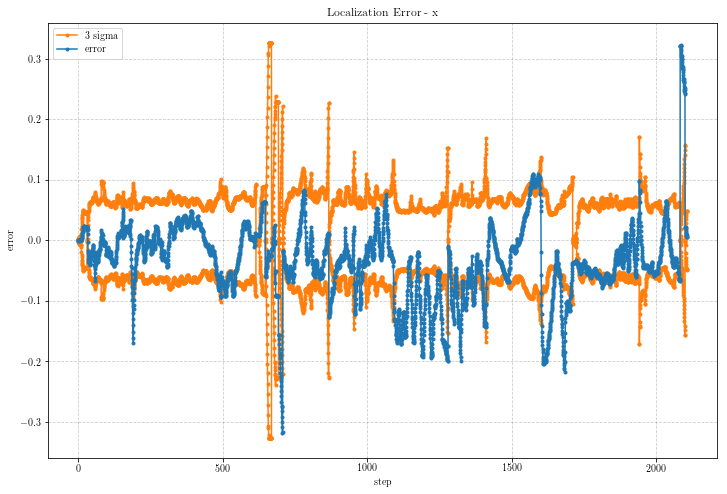

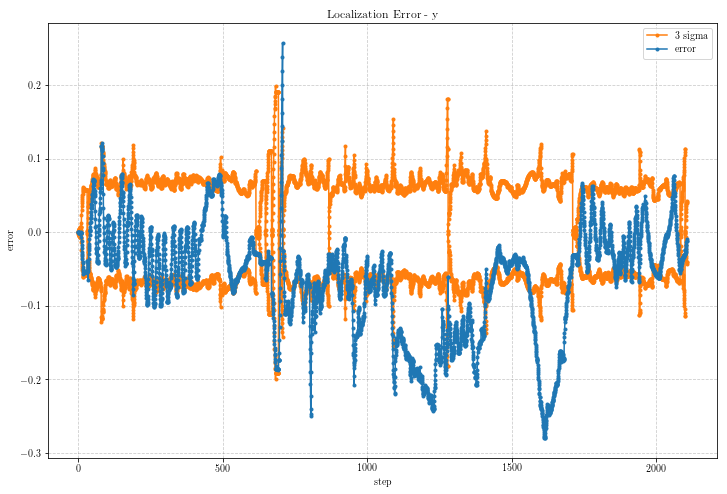

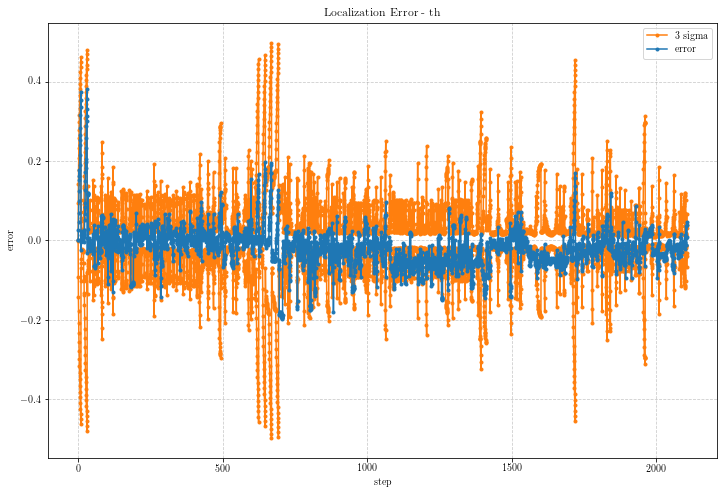

In [3]:
drawerror(df, 'l', 'Localization Error')

## Scan Matching

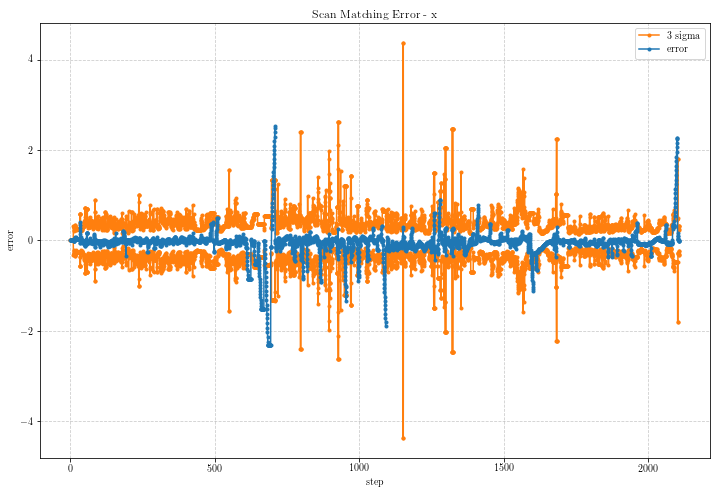

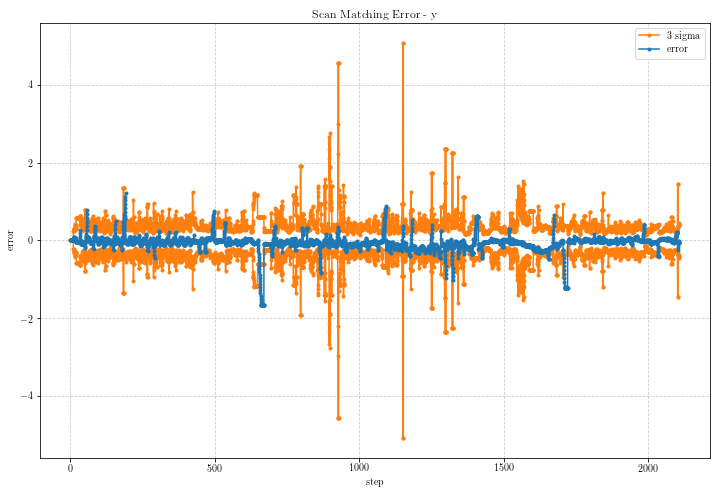

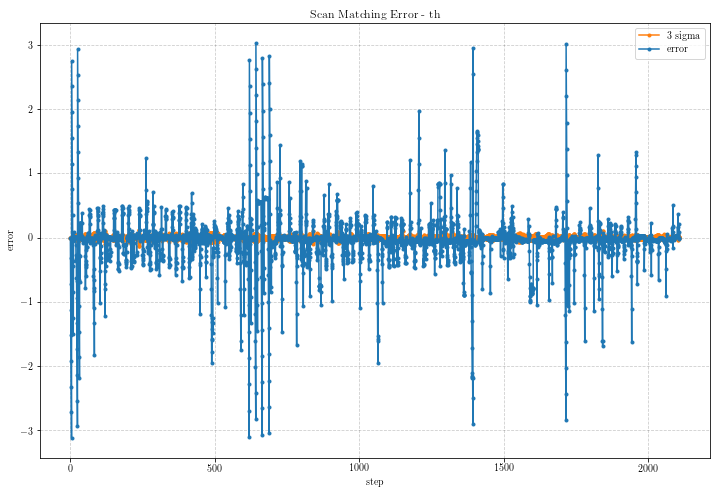

In [4]:
drawerror(df, 'u', 'Scan Matching Error')

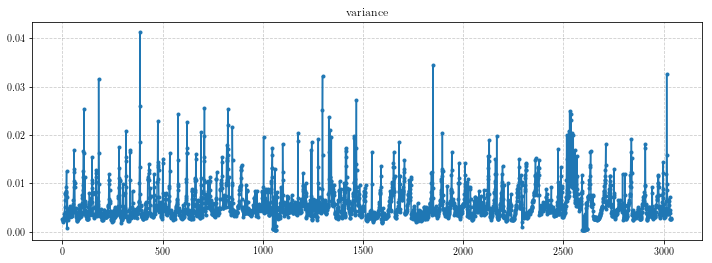

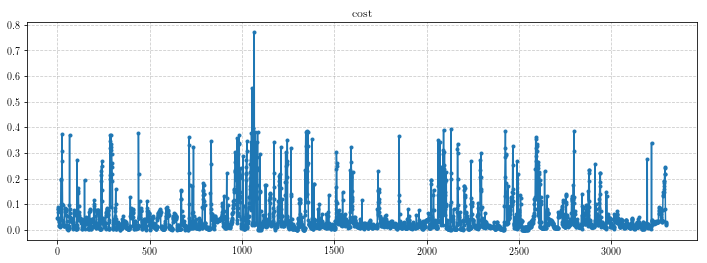

In [5]:
file_path1 = result_folder + test_folder + method +"/mmsm_analysis.csv"
file_path2 = result_folder + test_folder + method +"/mmsm_cost_analysis.csv"
file_path3 = result_folder + test_folder + method +"/mmsm_theta_analysis.csv"

df_mma = pd.read_csv(file_path1, header=None, sep='\s+')
df_mmca = pd.read_csv(file_path2, header=None, sep='\s+')
df_mmta = pd.read_csv(file_path3, header=None, sep='\s+')
plt.rcParams['figure.figsize'] = [12, 4]

def plotColumn(df,ttl):
    fig = plt.figure();
    ax =fig.gca()
    axes1, = plt.plot(df.iloc[0], ls='-', marker='.', color='C0')
    plt.title(ttl)
    ax.grid(color='k', linestyle='--', alpha = 0.2)
    labels1 = df.iloc[0].tolist()
    tooltip1 = mpld3.plugins.PointLabelTooltip(axes1, labels=labels1)
    mpld3.plugins.connect(fig, tooltip1)


plotColumn(df_mma, 'variance')
plotColumn(df_mmca, 'cost')

plt.show()

In [6]:
print("Localization Stat")
print(abs(df.loc[:,['ex_l', 'ey_l', 'eth_l']]).mean())
print(abs(df.loc[:,['ex_l', 'ey_l', 'eth_l']]).std())

Localization Stat
ex_l     0.053846
ey_l     0.076460
eth_l    0.035961
dtype: float64
ex_l     0.050518
ey_l     0.062639
eth_l    0.036629
dtype: float64


In [7]:
print("Localization Stat")
print(abs(df.loc[:,['ex_u', 'ey_u', 'eth_u']]).mean())
print(abs(df.loc[:,['ex_u', 'ey_u', 'eth_u']]).std())

Localization Stat
ex_u     0.137304
ey_u     0.118023
eth_u    0.199811
dtype: float64
ex_u     0.302163
ey_u     0.190857
eth_u    0.384038
dtype: float64


## Prior

In [8]:
# file_path = "/home/amirhossein/bob_test_results/temp/error_analysis.csv"
# 	ofs << time << "," << prior.pose.position.x << "," << prior.pose.position.y << "," << prior.pose.theta << "," <<
# 					prior.covariance(0,0) << "," << prior.covariance(1,1) << "," << prior.covariance(2,2) << 
# 					"," << 	update.pose.position.x << "," << update.pose.position.y << "," << update.pose.theta << "," <<
# 					update.covariance(0,0) << "," << update.covariance(1,1) << "," << update.covariance(2,2) << 
# 					"," << innovation.position.x << "," << innovation.position.y << "," << innovation.theta << "," <<
# 					inovationResodualCovariance(0,0) << "," << inovationResodualCovariance(1,1) << "," << inovationResodualCovariance(2,2) << 
# 					"\n";
ekf_file_path = result_folder + test_folder + method + "/ekf_analysis.csv"

dfekf = pd.read_csv(ekf_file_path, header=None)
dfekf.columns = ['t','x_p', 'y_p', 'th_p', 'ex_p_ub', 'ey_p_ub', 'eth_p_ub', 
                     'x_u', 'y_u', 'th_u', 'ex_u_ub', 'ey_u_ub', 'eth_u_ub',
                     'x_i', 'y_i', 'th_i', 'ex_i_ub', 'ey_i_ub', 'eth_i_ub']

In [9]:

def drawmapwcov(df, ub, v, ttl):
    fig = plt.figure();
    ax =fig.gca()
    plt.xlabel('step')
    plt.ylabel('error')
    plt.title(ttl)
    
    axes1, = plt.plot(df['t'], 3*(df[ub].pow(1./2)), ls='-', marker='.', color='C1', label=r'3 sigma')
    axes2, = plt.plot(df['t'], -3*(df[ub].pow(1./2)), ls='-', marker='.', color='C1', label='c')
    axes3, = plt.plot(df['t'], df[v], ls='-', marker='.', color='C0', label='error')

    ax.legend(handles=[axes1, axes3])
    ax.grid(color='k', linestyle='--', alpha = 0.2)


def drawerrorelementwcov(df, var ,mthd, ttl):
    ub = 'e'+var+'_'+ mthd + '_ub'
    v = var+'_'+ mthd 
    ttle = ttl + ' - ' + var
    drawmapwcov(df, ub, v, ttle)

def drawerrorwcov(df, mthd, ttl):
    drawerrorelementwcov(df, 'x', mthd, ttl)
    drawerrorelementwcov(df, 'y', mthd, ttl)
    drawerrorelementwcov(df, 'th', mthd, ttl)


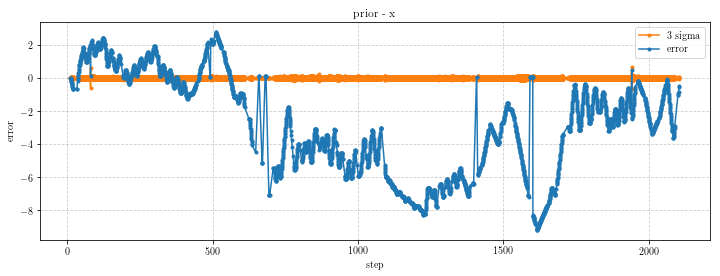

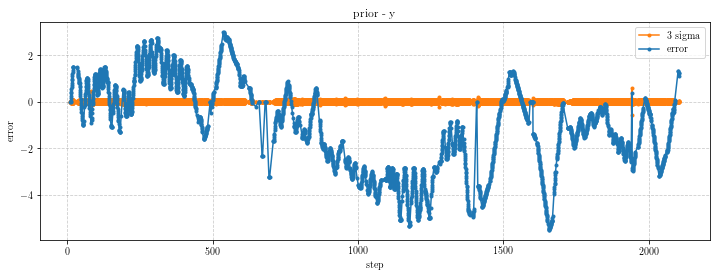

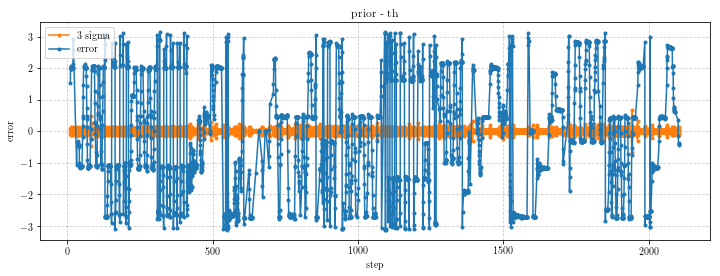

In [10]:
drawerrorwcov(dfekf, 'p', 'prior')

## Update

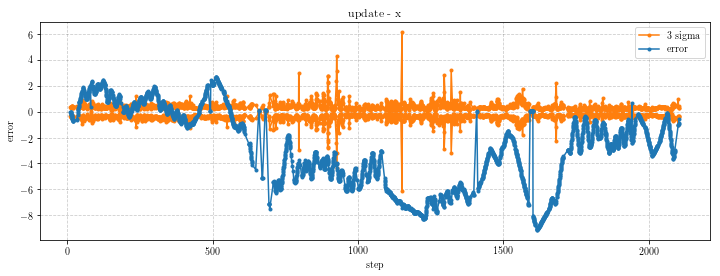

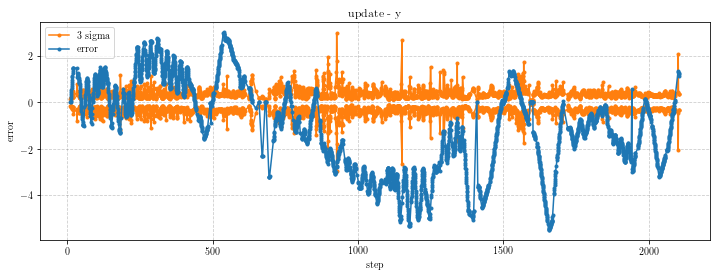

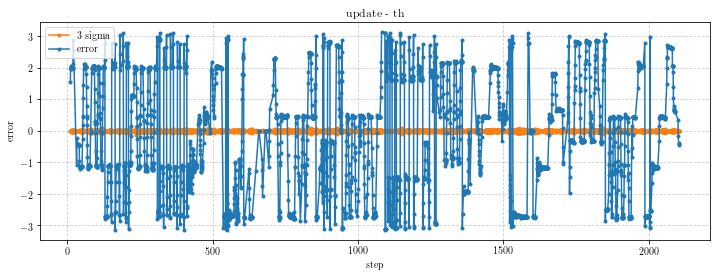

In [11]:
drawerrorwcov(dfekf, 'u', 'update')

## Innovation 

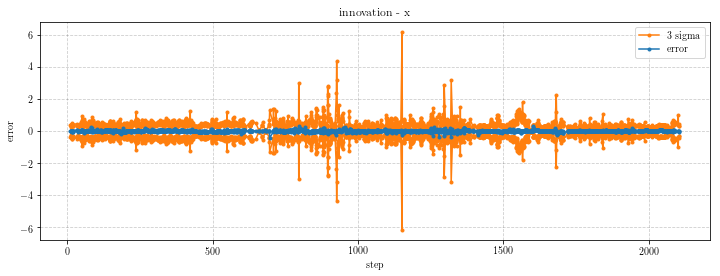

In [ ]:
drawerrorwcov(dfekf, 'i', 'innovation')

In [ ]:
print("Innovation Stat")
print(abs(dfekf.loc[:,['x_i', 'y_i', 'th_i']]).mean())
print(abs(dfekf.loc[:,['x_i', 'y_i', 'th_i']]).std())